In [1]:
import os
import tools
import numpy as np
import pandas as pd
import scanpy as sc

sc.logging.print_header()

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.21.5 scipy==1.7.1 pandas==1.3.4 scikit-learn==1.0.1 statsmodels==0.12.2 python-igraph==0.9.8 pynndescent==0.5.5


In [2]:
os.chdir('/lustre/scratch117/cellgen/team297/kt16/COVID_imperial_renal')

In [3]:
adata = sc.read_h5ad('h5ad/df.fil3_gex_kt_230622.h5ad')
adata

AnnData object with n_obs × n_vars = 916806 × 33559
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'nCount_ADT_raw', 'nFeature_ADT_raw', 'nCount_RNA_raw', 'nFeature_RNA_raw', 'soupxOnAdt', 'soupxOnRna', 'percentMito', 'exclude', 'centre', 'pool', 'tcrId', 'bcrId', 'celltypist_broad_predLabel', 'celltypist_broad_maxPredProb', 'haniffa_broad_predLabel', 'haniffa_broad_maxPredProb', 'yoshida_broad_predLabel', 'yoshida_broad_maxPredProb', 'celltypist_detailed_predLabel', 'celltypist_detailed_maxPredProb', 'yoshida_detailed_predLabel', 'yoshida_detailed_maxPredProb', 'seurat_clusters', 'RNA_sequencing_saturation', 'pool_factor', 'RNA_readsConfidentlyOnTranscriptome', 'RNA_readsConfidentlyOnGenome', 'RNA_readsOnGenome', 'RNA_Q30readsBarcode', 'RNA_Q30readsRead', 'RNA_Q30readsUmi', 'rna_snn_res.4', 'rna_snn_res.0.5', 'rna_snn_res.0.1', 'harmony_snn_res.4', 'yoshida_broad_predLabel_majorVote', 'harmony_snn_res.0.5', 'harmony_snn_res.0.1', 'cell_type_compartm

In [5]:
bdata = sc.read_h5ad('h5ad/df.fil3_gex_bcells_no_CLL_230622.h5ad')
bdata

AnnData object with n_obs × n_vars = 68683 × 330
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'nCount_ADT_raw', 'nFeature_ADT_raw', 'nCount_RNA_raw', 'nFeature_RNA_raw', 'soupxOnAdt', 'soupxOnRna', 'percentMito', 'exclude', 'centre', 'pool', 'tcrId', 'bcrId', 'celltypist_broad_predLabel', 'celltypist_broad_maxPredProb', 'haniffa_broad_predLabel', 'haniffa_broad_maxPredProb', 'yoshida_broad_predLabel', 'yoshida_broad_maxPredProb', 'celltypist_detailed_predLabel', 'celltypist_detailed_maxPredProb', 'yoshida_detailed_predLabel', 'yoshida_detailed_maxPredProb', 'seurat_clusters', 'RNA_sequencing_saturation', 'pool_factor', 'RNA_readsConfidentlyOnTranscriptome', 'RNA_readsConfidentlyOnGenome', 'RNA_readsOnGenome', 'RNA_Q30readsBarcode', 'RNA_Q30readsRead', 'RNA_Q30readsUmi', 'rna_snn_res.4', 'rna_snn_res.0.5', 'rna_snn_res.0.1', 'harmony_snn_res.4', 'yoshida_broad_predLabel_majorVote', 'harmony_snn_res.0.5', 'harmony_snn_res.0.1', 'cell_type_compartment

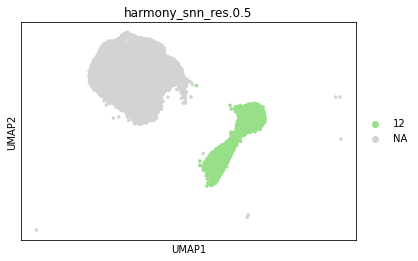

In [6]:
sc.pl.umap(adata[adata.obs['initial_cluster_B'].isin(['B'])], color = ['harmony_snn_res.0.5'], groups = ['12'], size = 50)

In [7]:
df4 = pd.read_csv('../newcastle_covid/datasets/Monaco B cells.txt', sep='\t', header=0, index_col = None, na_filter=False)

In [8]:
def geneset_score(self, genesets, groupby, figsize=(3, 4), cmap = 'viridis', col_cluster = True, row_cluster = True):
    import numpy as np
    import seaborn as sns
    for s in genesets:
        sc.tl.score_genes(self, [y for y in genesets[s] if y != ''], use_raw = True, score_name= str(s)+'_score')
    # calculate average enrichment score
    list1 = list(set(self.obs[groupby]))
    subset = self.obs[[groupby] + [str(s)+'_score' for s in genesets]]
    output = pd.DataFrame()
    for x in list1:
        subsetX = subset[subset[groupby] == x]
        outdict = {}
        for k in [str(s)+'_score' for s in genesets]:
            out = {k:np.mean(subsetX[k])}
            outdict.update(out)
        output = output.append(outdict, ignore_index=True)
    output.index = list1
    output = output[[str(s)+'_score' for s in genesets]]
    g = sns.clustermap(output.transpose(), standard_scale = 0, cmap=cmap, figsize=figsize, col_cluster = col_cluster, row_cluster = row_cluster)
    sc.pl.umap(self, color = [str(s)+'_score' for s in genesets], size = 10, ncols = 2)
    print(g)

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(


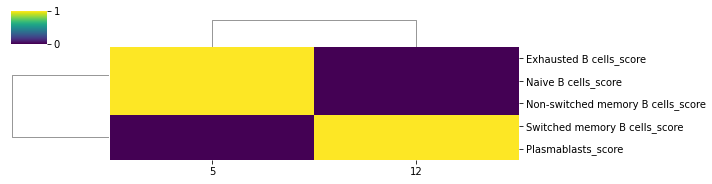

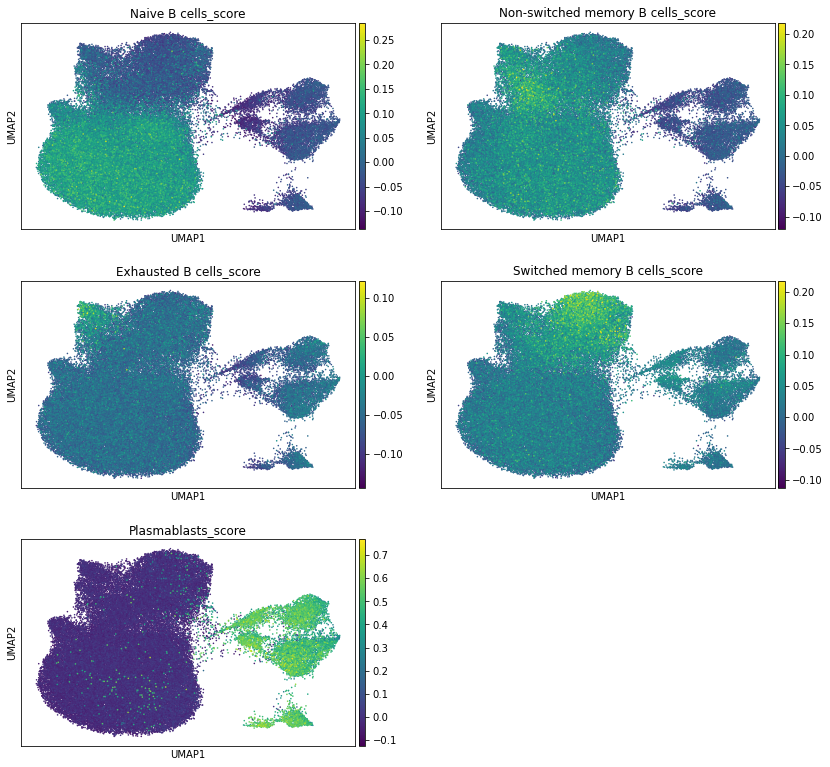

In [9]:
geneset_score(bdata, df4, 'harmony_snn_res.0.5', (10,2.5))

/tmp/ipykernel_46125/2193523879.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  bdata.obs['gmm_pct_b_scores'] = gmm.fit(X).predict(X)


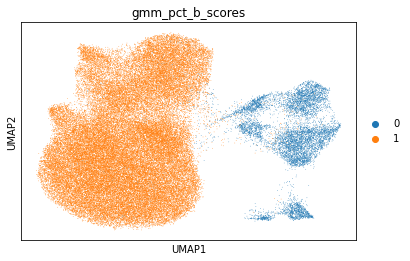

In [10]:
from sklearn import mixture
gmm = mixture.GaussianMixture(n_components=2, max_iter=1000, covariance_type='full')
X = bdata.obs[['Naive B cells_score', 'Non-switched memory B cells_score', 'Exhausted B cells_score', 'Switched memory B cells_score', 'Plasmablasts_score']]
bdata.obs['gmm_pct_b_scores'] = gmm.fit(X).predict(X)
bdata.obs['gmm_pct_b_scores'] = bdata.obs['gmm_pct_b_scores'].astype('category')
sc.pl.umap(bdata, color = 'gmm_pct_b_scores')

/tmp/ipykernel_46125/1619959519.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  bdata.obs['celltype_B'] = [b_dict[x] for x in bdata.obs['gmm_pct_b_scores']]
/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'celltype_B' as categorical


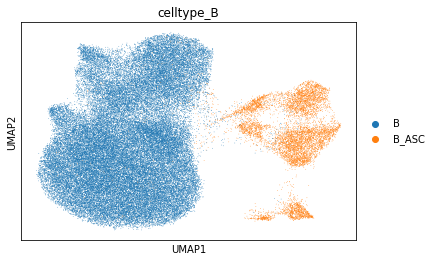

In [12]:
b_dict = {0:'B_ASC', 1:'B'}
bdata.obs['celltype_B'] = [b_dict[x] for x in bdata.obs['gmm_pct_b_scores']]
sc.pl.umap(bdata, color = 'celltype_B')

In [13]:
bdata.write_h5ad('h5ad/df.fil3_gex_bcells_no_CLL_230622.h5ad', compression = 'gzip')

### Redo clean up

In [14]:
adata = adata[adata.obs_names.isin(bdata.obs_names)].copy()
adata.obs['celltype_B'] = pd.Series(bdata.obs['celltype_B'])
adata

/tmp/ipykernel_46125/2725296517.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs['celltype_B'] = pd.Series(bdata.obs['celltype_B'])


AnnData object with n_obs × n_vars = 68683 × 33559
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'nCount_ADT_raw', 'nFeature_ADT_raw', 'nCount_RNA_raw', 'nFeature_RNA_raw', 'soupxOnAdt', 'soupxOnRna', 'percentMito', 'exclude', 'centre', 'pool', 'tcrId', 'bcrId', 'celltypist_broad_predLabel', 'celltypist_broad_maxPredProb', 'haniffa_broad_predLabel', 'haniffa_broad_maxPredProb', 'yoshida_broad_predLabel', 'yoshida_broad_maxPredProb', 'celltypist_detailed_predLabel', 'celltypist_detailed_maxPredProb', 'yoshida_detailed_predLabel', 'yoshida_detailed_maxPredProb', 'seurat_clusters', 'RNA_sequencing_saturation', 'pool_factor', 'RNA_readsConfidentlyOnTranscriptome', 'RNA_readsConfidentlyOnGenome', 'RNA_readsOnGenome', 'RNA_Q30readsBarcode', 'RNA_Q30readsRead', 'RNA_Q30readsUmi', 'rna_snn_res.4', 'rna_snn_res.0.5', 'rna_snn_res.0.1', 'harmony_snn_res.4', 'yoshida_broad_predLabel_majorVote', 'harmony_snn_res.0.5', 'harmony_snn_res.0.1', 'cell_type_compartme

In [15]:
# subset to bcells and ASC separately
bcell = adata[adata.obs['celltype_B'] == 'B'].copy()
ascs = adata[adata.obs['celltype_B'] == 'B_ASC'].copy()

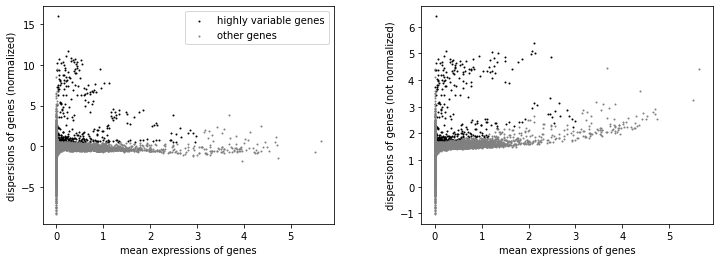

In [16]:
# find highly variable genes
sc.pp.highly_variable_genes(bcell, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(bcell)

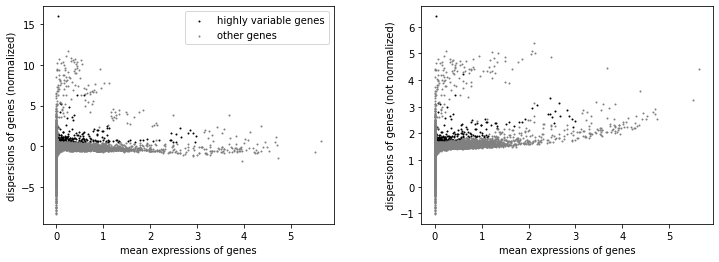

In [17]:
# remove vdj and light chain constant genes from highly variable genes, and also the viral reads
import re
for i in bcell.var.index:
    if re.search('^IG[HKL][VDJC]|VIRAL|^MTRNR', i):
        bcell.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(bcell)

In [18]:
# transfer to .raw slot
bcell.raw = bcell

In [19]:
# Filter the rna genes to only those marked as highly-variable
bcell = bcell[:, bcell.var.highly_variable].copy()
bcell

AnnData object with n_obs × n_vars = 60364 × 371
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'nCount_ADT_raw', 'nFeature_ADT_raw', 'nCount_RNA_raw', 'nFeature_RNA_raw', 'soupxOnAdt', 'soupxOnRna', 'percentMito', 'exclude', 'centre', 'pool', 'tcrId', 'bcrId', 'celltypist_broad_predLabel', 'celltypist_broad_maxPredProb', 'haniffa_broad_predLabel', 'haniffa_broad_maxPredProb', 'yoshida_broad_predLabel', 'yoshida_broad_maxPredProb', 'celltypist_detailed_predLabel', 'celltypist_detailed_maxPredProb', 'yoshida_detailed_predLabel', 'yoshida_detailed_maxPredProb', 'seurat_clusters', 'RNA_sequencing_saturation', 'pool_factor', 'RNA_readsConfidentlyOnTranscriptome', 'RNA_readsConfidentlyOnGenome', 'RNA_readsOnGenome', 'RNA_Q30readsBarcode', 'RNA_Q30readsRead', 'RNA_Q30readsUmi', 'rna_snn_res.4', 'rna_snn_res.0.5', 'rna_snn_res.0.1', 'harmony_snn_res.4', 'yoshida_broad_predLabel_majorVote', 'harmony_snn_res.0.5', 'harmony_snn_res.0.1', 'cell_type_compartment

In [20]:
import scvi

Global seed set to 0


In [21]:
scvi.model.SCVI.setup_anndata(
    bcell,
    layer="counts",
    batch_key = 'orig.ident',
    continuous_covariate_keys=['nCount_RNA', 'percentMito']
)
model = scvi.model.SCVI(bcell)
model.train()
latent = model.get_latent_representation()
bcell.obsm["X_scVI"] = latent

INFO     Using batches from adata.obs["orig.ident"]                                          
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Successfully registered anndata object containing 60364 cells, 371 vars, 119        
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 2 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/data/_anndata.py:728: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[alternate_column_key] = codes
/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/data/_anndata.py:743: UserWarning: Category 31 in adata.obs['_scvi_batch'] has fewer than 3 cells. SCVI may not train properly.
  warnings.warn(
/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/data/_anndata.py:586: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, 

Epoch 1/133:   0%|                                                                                                                    | 0/133 [00:00<?, ?it/s]

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 133/133: 100%|█████████████████████████████████████████████████████████████████████████████████████| 133/133 [11:48<00:00,  5.33s/it, loss=112, v_num=1]


/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/model/base/_base_model.py:150: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  warnings.warn(


In [22]:
sc.pp.neighbors(bcell, use_rep="X_scVI")
sc.tl.umap(bcell, min_dist=0.3)

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scanpy/tools/_leiden.py:158: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[key_added] = pd.Categorical(


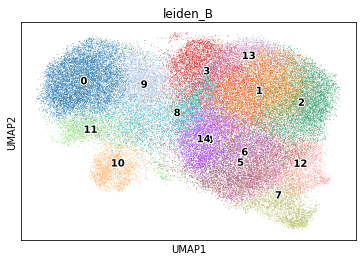

In [23]:
sc.tl.leiden(bcell, key_added = 'leiden_B')
sc.pl.umap(bcell, color = 'leiden_B', legend_loc = 'on data', legend_fontoutline = 2)

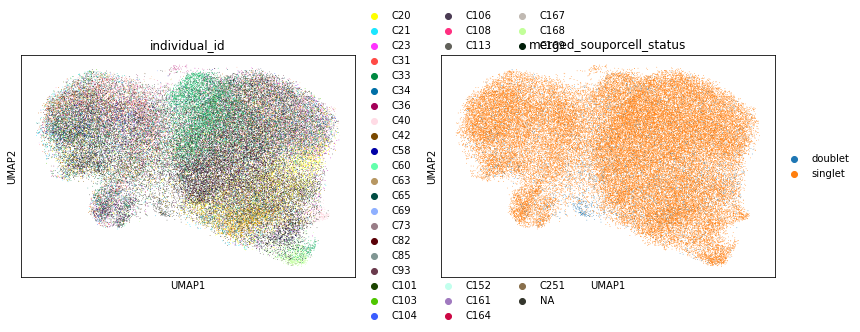

In [24]:
sc.pl.umap(bcell, color = ['individual_id','merged_souporcell_status'])

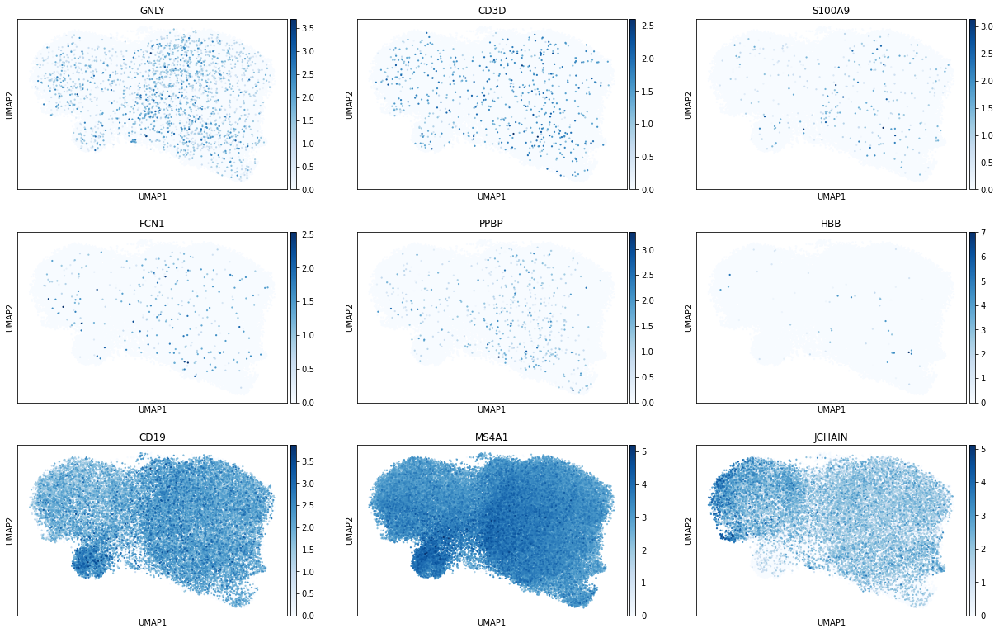

In [25]:
sc.pl.umap(bcell, color=['GNLY', 'CD3D', 'S100A9', 'FCN1', 'PPBP', 'HBB', 'CD19', 'MS4A1', 'JCHAIN'], color_map = 'Blues', size = 20, ncols = 3)

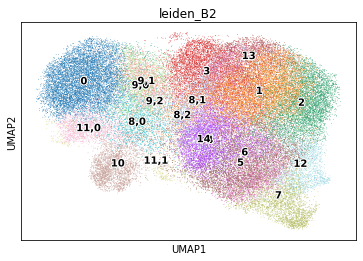

In [36]:
sc.tl.leiden(bcell, key_added = 'leiden_B2', resolution = .2, restrict_to = ('leiden_B', ['11']))
sc.tl.leiden(bcell, key_added = 'leiden_B2', resolution = .3, restrict_to = ('leiden_B2', ['8']))
sc.tl.leiden(bcell, key_added = 'leiden_B2', resolution = .3, restrict_to = ('leiden_B2', ['9']))
sc.pl.umap(bcell, color = 'leiden_B2', legend_loc = 'on data', legend_fontoutline = 2)

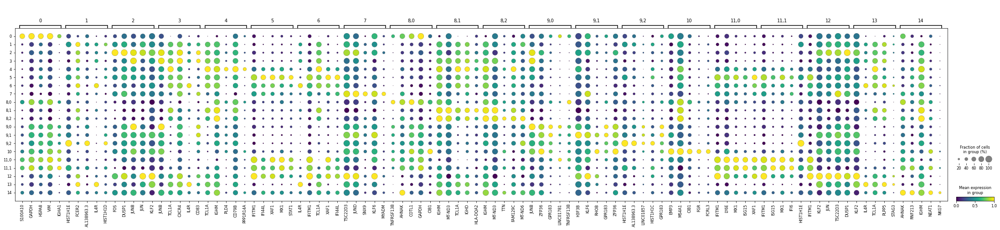

In [37]:
sc.tl.rank_genes_groups(bcell, groupby = 'leiden_B2')
sc.pl.rank_genes_groups_dotplot(bcell, min_logfoldchange =1, n_genes=5, standard_scale = 'var',  color_map = 'viridis', dendrogram = False)

In [38]:
for i in ['Naive B cells_score', 'Non-switched memory B cells_score', 'Exhausted B cells_score', 'Switched memory B cells_score']:
    bcell.obs[i] = pd.Series(bdata.obs[i])

In [39]:
def summarised_geneset_scores(self, genesets, groupby, figsize=(3, 4), cmap = 'viridis', col_cluster = True, row_cluster = True):
    import numpy as np
    import seaborn as sns
    # calculate average enrichment score
    list1 = list(set(self.obs[groupby]))
    subset = self.obs[[groupby] + [str(s) for s in genesets]]
    output = pd.DataFrame()
    for x in list1:
        subsetX = subset[subset[groupby] == x]
        outdict = {}
        for k in [str(s) for s in genesets]:
            out = {k:np.mean(subsetX[k])}
            outdict.update(out)
        output = output.append(outdict, ignore_index=True)
    output.index = list1
    output = output[[str(s) for s in genesets]]
    g = sns.clustermap(output.transpose(), standard_scale = 0, cmap=cmap, figsize=figsize, col_cluster = col_cluster, row_cluster = row_cluster)
    sc.pl.umap(self, color = [str(s) for s in genesets], size = 10, ncols = 2)
    print(g)

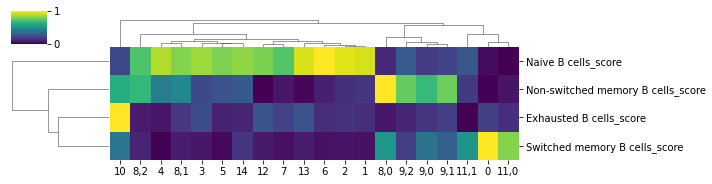

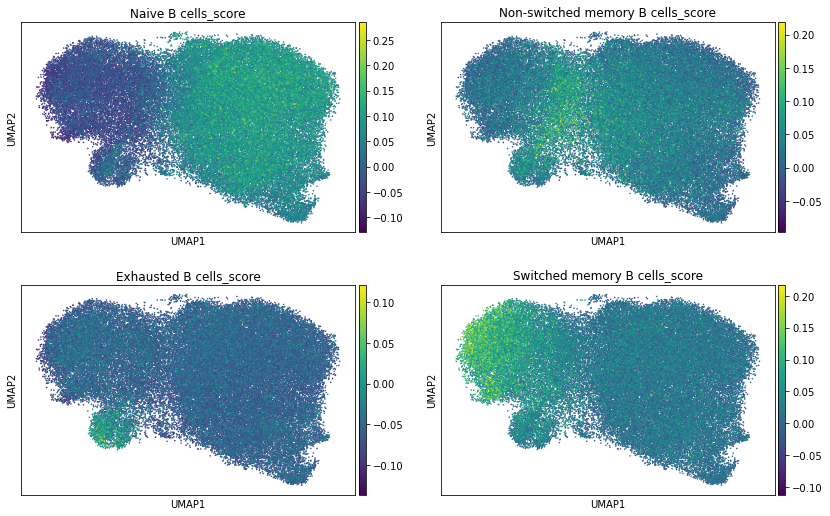

In [40]:
summarised_geneset_scores(bcell, ['Naive B cells_score', 
                                  'Non-switched memory B cells_score', 
                                  'Exhausted B cells_score', 
                                  'Switched memory B cells_score'], 
                          'leiden_B2',
                          (10,2.5))

In [41]:
# read in the adt file
adt = sc.read_h5ad('h5ad/df.fil3_adt.h5ad')
badt = adt[adt.obs_names.isin(bcell.obs_names)].copy()
badt.obsm = bcell.obsm.copy()
badt.obs = bcell.obs.copy()
badt

AnnData object with n_obs × n_vars = 60364 × 137
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'nCount_ADT_raw', 'nFeature_ADT_raw', 'nCount_RNA_raw', 'nFeature_RNA_raw', 'soupxOnAdt', 'soupxOnRna', 'percentMito', 'exclude', 'centre', 'pool', 'tcrId', 'bcrId', 'celltypist_broad_predLabel', 'celltypist_broad_maxPredProb', 'haniffa_broad_predLabel', 'haniffa_broad_maxPredProb', 'yoshida_broad_predLabel', 'yoshida_broad_maxPredProb', 'celltypist_detailed_predLabel', 'celltypist_detailed_maxPredProb', 'yoshida_detailed_predLabel', 'yoshida_detailed_maxPredProb', 'seurat_clusters', 'RNA_sequencing_saturation', 'pool_factor', 'RNA_readsConfidentlyOnTranscriptome', 'RNA_readsConfidentlyOnGenome', 'RNA_readsOnGenome', 'RNA_Q30readsBarcode', 'RNA_Q30readsRead', 'RNA_Q30readsUmi', 'rna_snn_res.4', 'rna_snn_res.0.5', 'rna_snn_res.0.1', 'harmony_snn_res.4', 'yoshida_broad_predLabel_majorVote', 'harmony_snn_res.0.5', 'harmony_snn_res.0.1', 'cell_type_compartment

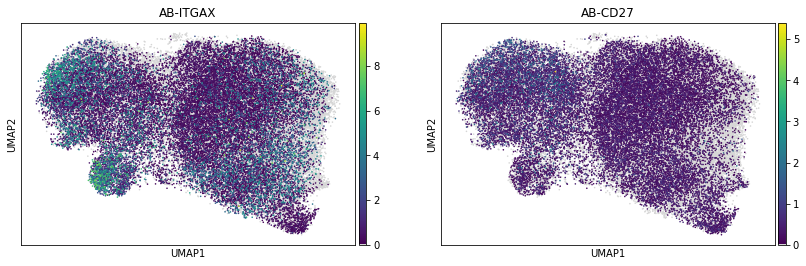

In [42]:
sc.pl.umap(badt, color = ['AB-ITGAX', 'AB-CD27'], color_map = tools.cmp(), size = 10)

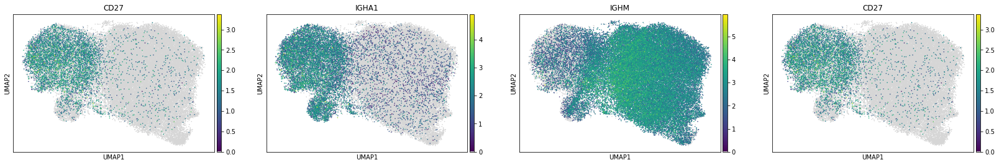

In [43]:
sc.pl.umap(bcell, color = ['CD27', 'IGHA1', 'IGHM', 'CD27'], color_map = tools.cmp(), size = 10)

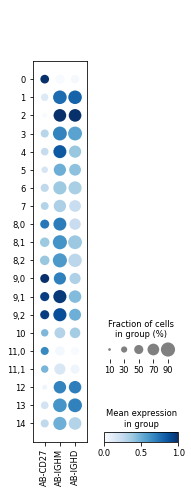

In [44]:
ax = sc.pl.dotplot(badt, ['AB-CD27', 'AB-IGHM','AB-IGHD'], groupby = 'leiden_B2', color_map = 'Blues', standard_scale = 'var', return_fig = True)
ax.style(dot_edge_lw = 0, cmap = 'Blues')
ax.show()

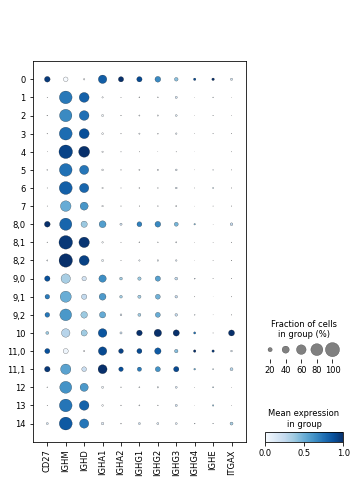

In [45]:
sc.pl.dotplot(bcell, ['CD27','IGHM','IGHD','IGHA1', 'IGHA2', 'IGHG1','IGHG2','IGHG3','IGHG4','IGHE','ITGAX'], groupby = 'leiden_B2', color_map = 'Blues', standard_scale = 'var')

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'celltype_B' as categorical


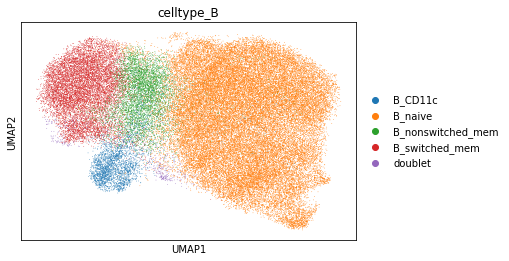

In [46]:
b_dict = {'0':'B_switched_mem',
'1':'B_naive',
'2':'B_naive',
'3':'B_naive',
'4':'B_naive',
'5':'B_naive',
'6':'B_naive',
'7':'B_naive',
'8,0':'B_nonswitched_mem',
'8,1':'B_naive',
'8,2':'B_naive',
'9,0':'B_nonswitched_mem',
'9,1':'B_nonswitched_mem',
'9,2':'B_nonswitched_mem',
'10':'B_CD11c',
'11,0':'B_switched_mem',
'11,1':'doublet',
'12':'B_naive',
'13':'B_naive',
'14':'B_naive',}
bcell.obs['celltype_B'] = [b_dict[x] for x in bcell.obs['leiden_B2']]
sc.pl.umap(bcell, color = 'celltype_B')

In [48]:
adata.obs['celltype_B'] = adata.obs['celltype_B'].astype('object')
adata.obs['celltype_B'].update(bcell.obs['celltype_B'])

### subcluster naive

In [49]:
bnav = adata[adata.obs['celltype_B'] == 'B_naive'].copy()

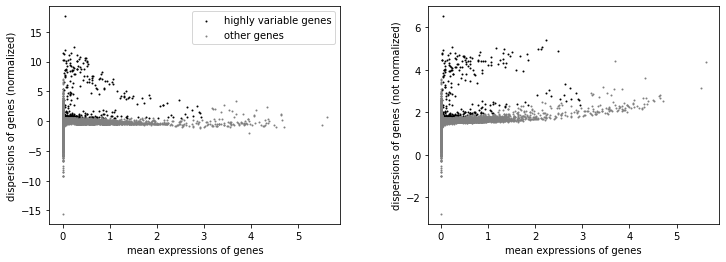

In [50]:
# find highly variable genes
sc.pp.highly_variable_genes(bnav, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(bnav)

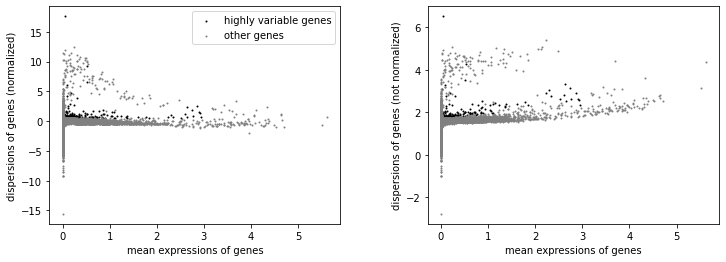

In [51]:
# remove vdj and light chain constant genes from highly variable genes, and also the viral reads
import re
for i in bnav.var.index:
    if re.search('^IG[HKL][VDJC]|VIRAL|^MTRNR', i):
        bnav.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(bnav)

In [52]:
# transfer to .raw slot
bnav.raw = bnav

In [53]:
# Filter the rna genes to only those marked as highly-variable
bnav = bnav[:, bnav.var.highly_variable].copy()
bnav

AnnData object with n_obs × n_vars = 41687 × 275
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'nCount_ADT_raw', 'nFeature_ADT_raw', 'nCount_RNA_raw', 'nFeature_RNA_raw', 'soupxOnAdt', 'soupxOnRna', 'percentMito', 'exclude', 'centre', 'pool', 'tcrId', 'bcrId', 'celltypist_broad_predLabel', 'celltypist_broad_maxPredProb', 'haniffa_broad_predLabel', 'haniffa_broad_maxPredProb', 'yoshida_broad_predLabel', 'yoshida_broad_maxPredProb', 'celltypist_detailed_predLabel', 'celltypist_detailed_maxPredProb', 'yoshida_detailed_predLabel', 'yoshida_detailed_maxPredProb', 'seurat_clusters', 'RNA_sequencing_saturation', 'pool_factor', 'RNA_readsConfidentlyOnTranscriptome', 'RNA_readsConfidentlyOnGenome', 'RNA_readsOnGenome', 'RNA_Q30readsBarcode', 'RNA_Q30readsRead', 'RNA_Q30readsUmi', 'rna_snn_res.4', 'rna_snn_res.0.5', 'rna_snn_res.0.1', 'harmony_snn_res.4', 'yoshida_broad_predLabel_majorVote', 'harmony_snn_res.0.5', 'harmony_snn_res.0.1', 'cell_type_compartment

In [54]:
scvi.model.SCVI.setup_anndata(
    bnav,
    layer="counts",
    batch_key = 'orig.ident',
    continuous_covariate_keys=['nCount_RNA', 'percentMito']
)
model = scvi.model.SCVI(bnav)
model.train()
latent = model.get_latent_representation()
bnav.obsm["X_scVI"] = latent

INFO     Using batches from adata.obs["orig.ident"]                                          
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Successfully registered anndata object containing 41687 cells, 275 vars, 118        
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 2 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/data/_anndata.py:728: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[alternate_column_key] = codes
/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/data/_anndata.py:586: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[labels_key] = np.zeros(adata.shape[0], dtype=np.int64)
/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/data/_anndata.py:315: UserWarning: Training will

Epoch 1/192:   0%|                                                                                                                    | 0/192 [00:00<?, ?it/s]

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 192/192: 100%|████████████████████████████████████████████████████████████████████████████████████| 192/192 [09:51<00:00,  3.08s/it, loss=77.1, v_num=1]


/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/model/base/_base_model.py:150: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  warnings.warn(


In [55]:
sc.pp.neighbors(bnav, use_rep="X_scVI")
sc.tl.umap(bnav, min_dist=0.3)

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scanpy/tools/_leiden.py:158: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[key_added] = pd.Categorical(
/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'celltype_B' as categorical


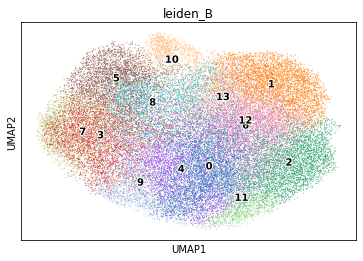

In [56]:
sc.tl.leiden(bnav, key_added = 'leiden_B')
sc.pl.umap(bnav, color = ['leiden_B'], legend_loc = 'on data', legend_fontoutline = 2)

In [ ]:
# sc.tl.leiden(bnav, key_added = 'leiden_B2', restrict_to = ('leiden_B', ['3']), resolution = .3)
# # sc.tl.leiden(bnav, key_added = 'leiden_B2', restrict_to = ('leiden_B2', ['10']), resolution = .5)
# sc.pl.umap(bnav, color = ['leiden_B2', 'celltype_B'], legend_loc = 'on data', legend_fontoutline = 2)

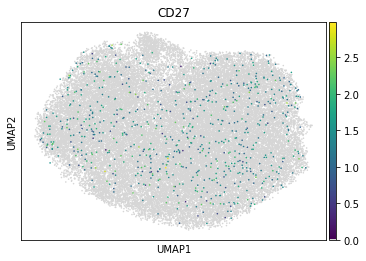

In [57]:
sc.pl.umap(bnav, color = ['CD27'], color_map = tools.cmp(), size = 10)

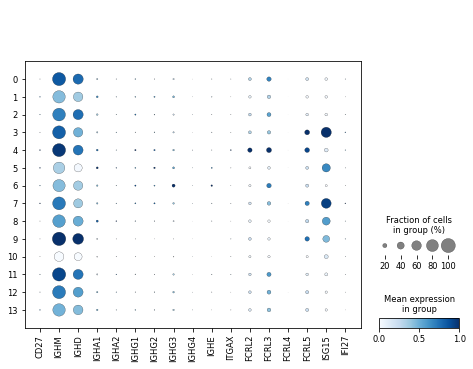

In [58]:
sc.pl.dotplot(bnav, ['CD27','IGHM','IGHD','IGHA1', 'IGHA2', 'IGHG1','IGHG2','IGHG3','IGHG4','IGHE','ITGAX', 'FCRL2','FCRL3','FCRL4','FCRL5', 'ISG15', 'IFI27'], groupby = 'leiden_B', color_map = 'Blues', standard_scale = 'var')

/tmp/ipykernel_46125/826093910.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  bnav.obs[i] = pd.Series(bdata.obs[i])


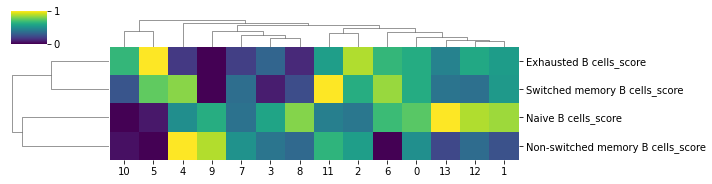

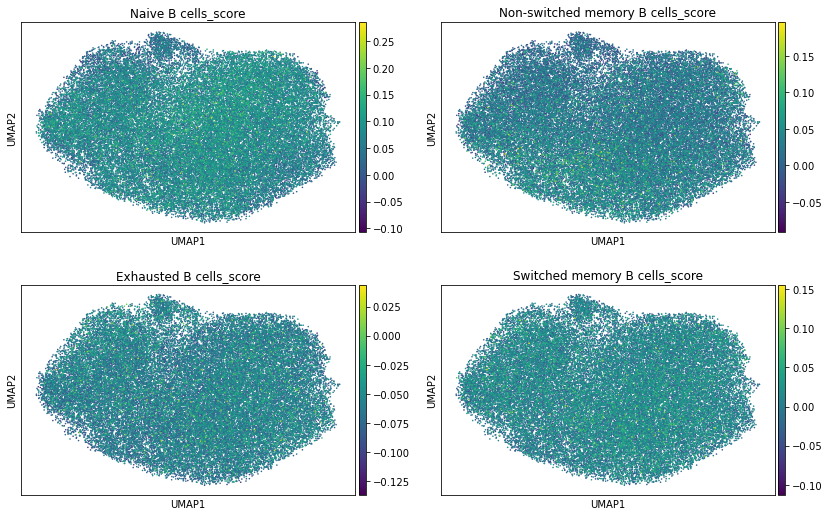

In [60]:
for i in ['Naive B cells_score', 'Non-switched memory B cells_score', 'Exhausted B cells_score', 'Switched memory B cells_score']:
    bnav.obs[i] = pd.Series(bdata.obs[i])
summarised_geneset_scores(bnav, ['Naive B cells_score', 
                                  'Non-switched memory B cells_score', 
                                  'Exhausted B cells_score', 
                                  'Switched memory B cells_score'], 
                          'leiden_B',
                          (10,2.5))

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'celltype_B' as categorical


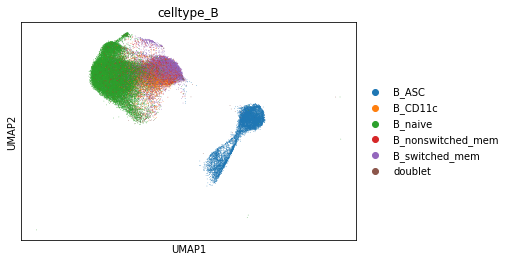

In [61]:
sc.pl.umap(adata, color = 'celltype_B')

### subcluster memory

In [62]:
bmem = adata[adata.obs['celltype_B'].isin(['B_nonswitched_mem', 'B_switched_mem', 'B_CD11c'])].copy()
bmem

AnnData object with n_obs × n_vars = 18243 × 33559
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'nCount_ADT_raw', 'nFeature_ADT_raw', 'nCount_RNA_raw', 'nFeature_RNA_raw', 'soupxOnAdt', 'soupxOnRna', 'percentMito', 'exclude', 'centre', 'pool', 'tcrId', 'bcrId', 'celltypist_broad_predLabel', 'celltypist_broad_maxPredProb', 'haniffa_broad_predLabel', 'haniffa_broad_maxPredProb', 'yoshida_broad_predLabel', 'yoshida_broad_maxPredProb', 'celltypist_detailed_predLabel', 'celltypist_detailed_maxPredProb', 'yoshida_detailed_predLabel', 'yoshida_detailed_maxPredProb', 'seurat_clusters', 'RNA_sequencing_saturation', 'pool_factor', 'RNA_readsConfidentlyOnTranscriptome', 'RNA_readsConfidentlyOnGenome', 'RNA_readsOnGenome', 'RNA_Q30readsBarcode', 'RNA_Q30readsRead', 'RNA_Q30readsUmi', 'rna_snn_res.4', 'rna_snn_res.0.5', 'rna_snn_res.0.1', 'harmony_snn_res.4', 'yoshida_broad_predLabel_majorVote', 'harmony_snn_res.0.5', 'harmony_snn_res.0.1', 'cell_type_compartme

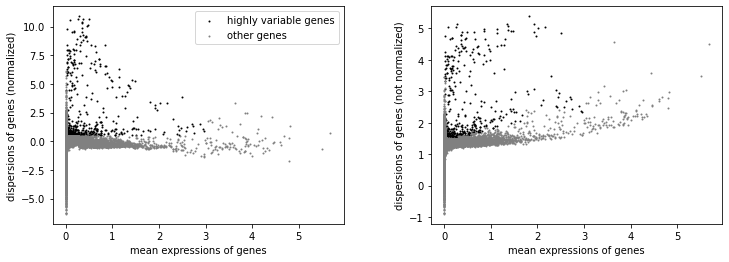

In [63]:
# find highly variable genes
sc.pp.highly_variable_genes(bmem, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(bmem)

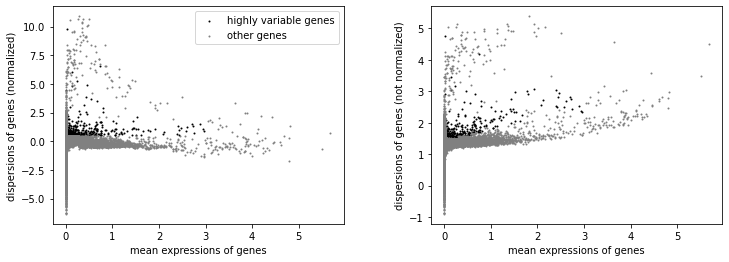

In [64]:
# remove vdj and light chain constant genes from highly variable genes, and also the viral reads
import re
for i in bmem.var.index:
    if re.search('^IG[HKL][VDJC]|VIRAL|^MTRNR', i):
        bmem.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(bmem)

In [65]:
# transfer to .raw slot
bmem.raw = bmem

In [66]:
# Filter the rna genes to only those marked as highly-variable
bmem = bmem[:, bmem.var.highly_variable].copy()
bmem

AnnData object with n_obs × n_vars = 18243 × 596
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'nCount_ADT_raw', 'nFeature_ADT_raw', 'nCount_RNA_raw', 'nFeature_RNA_raw', 'soupxOnAdt', 'soupxOnRna', 'percentMito', 'exclude', 'centre', 'pool', 'tcrId', 'bcrId', 'celltypist_broad_predLabel', 'celltypist_broad_maxPredProb', 'haniffa_broad_predLabel', 'haniffa_broad_maxPredProb', 'yoshida_broad_predLabel', 'yoshida_broad_maxPredProb', 'celltypist_detailed_predLabel', 'celltypist_detailed_maxPredProb', 'yoshida_detailed_predLabel', 'yoshida_detailed_maxPredProb', 'seurat_clusters', 'RNA_sequencing_saturation', 'pool_factor', 'RNA_readsConfidentlyOnTranscriptome', 'RNA_readsConfidentlyOnGenome', 'RNA_readsOnGenome', 'RNA_Q30readsBarcode', 'RNA_Q30readsRead', 'RNA_Q30readsUmi', 'rna_snn_res.4', 'rna_snn_res.0.5', 'rna_snn_res.0.1', 'harmony_snn_res.4', 'yoshida_broad_predLabel_majorVote', 'harmony_snn_res.0.5', 'harmony_snn_res.0.1', 'cell_type_compartment

In [67]:
scvi.model.SCVI.setup_anndata(
    bmem,
    layer="counts",
    batch_key = 'orig.ident',
    continuous_covariate_keys=['nCount_RNA', 'percentMito']
)
model = scvi.model.SCVI(bmem)
model.train()
latent = model.get_latent_representation()
bmem.obsm["X_scVI"] = latent

INFO     Using batches from adata.obs["orig.ident"]                                          
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Successfully registered anndata object containing 18243 cells, 596 vars, 119        
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 2 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/data/_anndata.py:728: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[alternate_column_key] = codes
/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/data/_anndata.py:743: UserWarning: Category 31 in adata.obs['_scvi_batch'] has fewer than 3 cells. SCVI may not train properly.
  warnings.warn(
/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/data/_anndata.py:586: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, 

Epoch 1/400:   0%|                                                                                                                    | 0/400 [00:00<?, ?it/s]

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 400/400: 100%|█████████████████████████████████████████████████████████████████████████████████████| 400/400 [08:55<00:00,  1.34s/it, loss=164, v_num=1]


/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/model/base/_base_model.py:150: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  warnings.warn(


In [68]:
sc.pp.neighbors(bmem, use_rep="X_scVI")
sc.tl.umap(bmem, min_dist=0.3)

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scanpy/tools/_leiden.py:158: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[key_added] = pd.Categorical(


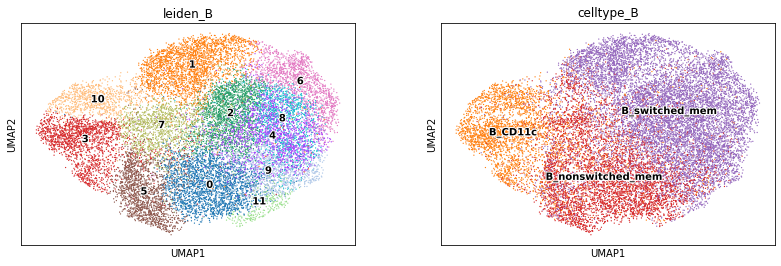

In [69]:
sc.tl.leiden(bmem, key_added = 'leiden_B')
sc.pl.umap(bmem, color = ['leiden_B', 'celltype_B'], legend_loc = 'on data', legend_fontoutline = 2)

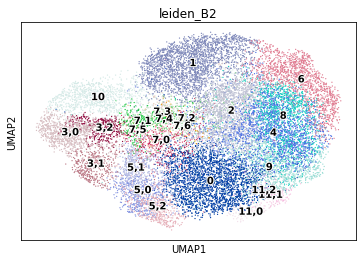

In [143]:
sc.tl.leiden(bmem, key_added = 'leiden_B2', restrict_to = ('leiden_B', ['3']), resolution = .3)
sc.tl.leiden(bmem, key_added = 'leiden_B2', restrict_to = ('leiden_B2', ['5']), resolution = .4)
sc.tl.leiden(bmem, key_added = 'leiden_B2', restrict_to = ('leiden_B2', ['7']), resolution = .5)
sc.tl.leiden(bmem, key_added = 'leiden_B2', restrict_to = ('leiden_B2', ['11']), resolution = .3)
sc.pl.umap(bmem, color = ['leiden_B2'], legend_loc = 'on data', legend_fontoutline = 2)

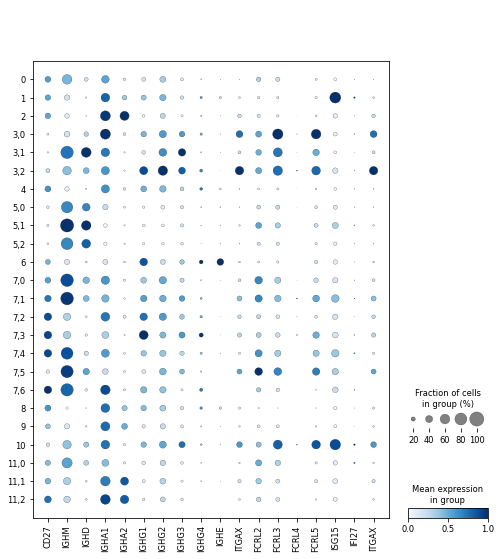

In [144]:
sc.pl.dotplot(bmem, ['CD27','IGHM','IGHD','IGHA1', 'IGHA2', 'IGHG1','IGHG2','IGHG3','IGHG4','IGHE','ITGAX', 'FCRL2','FCRL3','FCRL4','FCRL5', 'ISG15', 'IFI27', 'ITGAX'], groupby = 'leiden_B2', color_map = 'Blues', standard_scale = 'var')

In [145]:
# read in the adt file
# adt = sc.read_h5ad('h5ad/df.fil3_adt.h5ad')
badt = adt[adt.obs_names.isin(bmem.obs_names)].copy()
badt.obsm = bmem.obsm.copy()
badt.obs = bmem.obs.copy()
# badt

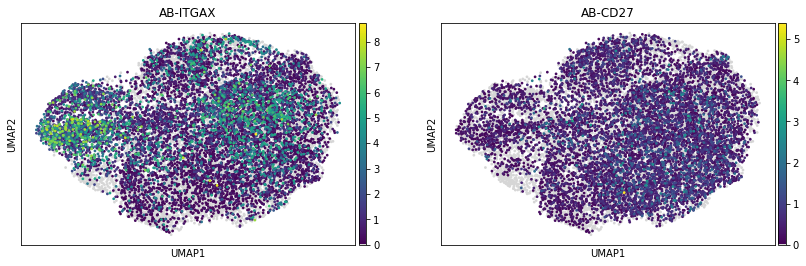

In [146]:
sc.pl.umap(badt, color = ['AB-ITGAX', 'AB-CD27'], color_map = tools.cmp(), size = 30)

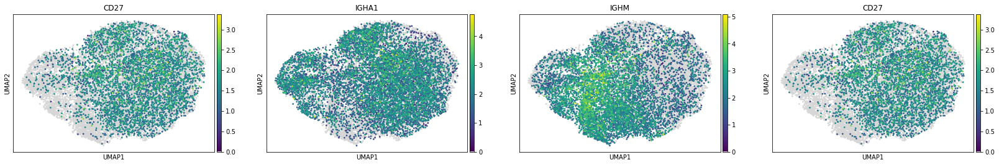

In [147]:
sc.pl.umap(bmem, color = ['CD27', 'IGHA1', 'IGHM', 'CD27'], color_map = tools.cmp(), size = 30)

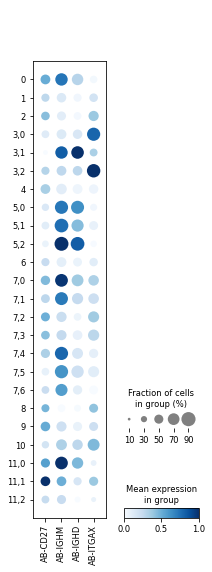

In [148]:
ax = sc.pl.dotplot(badt, ['AB-CD27', 'AB-IGHM','AB-IGHD', 'AB-ITGAX'], groupby = 'leiden_B2', color_map = 'Blues', standard_scale = 'var', return_fig = True)
ax.style(dot_edge_lw = 0, cmap = 'Blues')
ax.show()

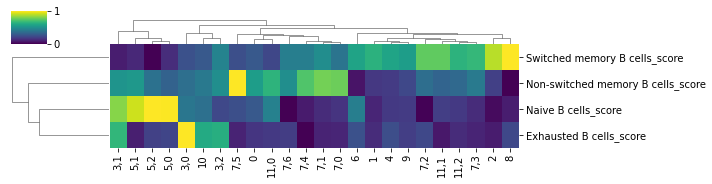

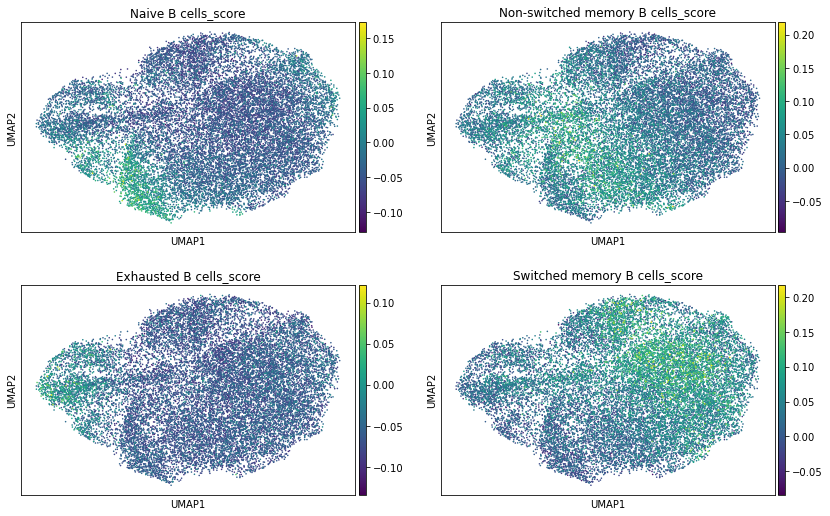

In [149]:
for i in ['Naive B cells_score', 'Non-switched memory B cells_score', 'Exhausted B cells_score', 'Switched memory B cells_score']:
    bmem.obs[i] = pd.Series(bdata.obs[i])
summarised_geneset_scores(bmem, ['Naive B cells_score', 
                                  'Non-switched memory B cells_score', 
                                  'Exhausted B cells_score', 
                                  'Switched memory B cells_score'], 
                          'leiden_B2',
                          (10,2.5))

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'celltype_B' as categorical


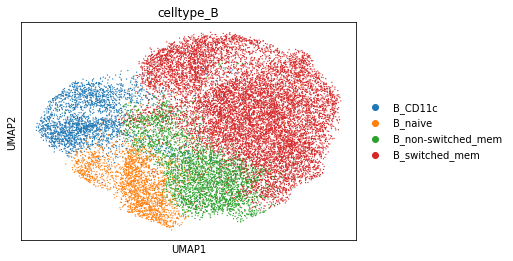

In [151]:
b_dict = {'0':'B_non-switched_mem',
'1':'B_switched_mem',
'2':'B_switched_mem',
'3,0':'B_CD11c',
'3,1':'B_naive',
'3,2':'B_CD11c',
'4':'B_switched_mem',
'5,0':'B_naive',
'5,1':'B_naive',
'5,2':'B_naive',
'6':'B_switched_mem',
'7,0':'B_non-switched_mem',
'7,1':'B_non-switched_mem',
'7,2':'B_switched_mem',
'7,3':'B_switched_mem',
'7,4':'B_non-switched_mem',
'7,5':'B_non-switched_mem',
'7,6':'B_non-switched_mem',
'8':'B_switched_mem',
'9':'B_switched_mem',
'10':'B_CD11c',
'11,0':'B_non-switched_mem',
'11,1':'B_switched_mem',
'11,2':'B_switched_mem',
}
bmem.obs['celltype_B'] = [b_dict[x] for x in bmem.obs['leiden_B2']]
sc.pl.umap(bmem, color = 'celltype_B')

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'celltype_B' as categorical


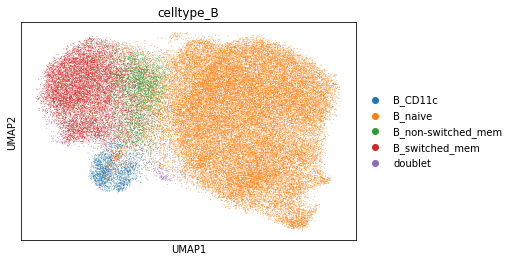

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'celltype_B' as categorical


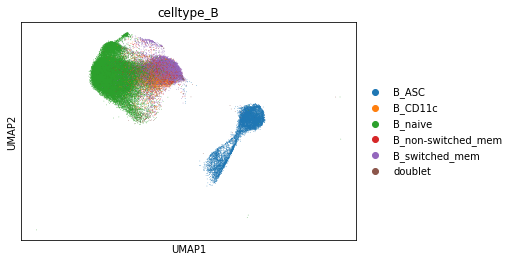

In [152]:
adata.obs['celltype_B'] = adata.obs['celltype_B'].astype('object')
bcell.obs['celltype_B'] = bcell.obs['celltype_B'].astype('object')
adata.obs['celltype_B'].update(pd.Series(bmem.obs['celltype_B']))
bcell.obs['celltype_B'].update(pd.Series(bmem.obs['celltype_B']))
sc.pl.umap(bcell, color = 'celltype_B')
sc.pl.umap(adata, color = 'celltype_B')

### analyse the ASCs

In [192]:
ascs = bdata[bdata.obs['celltype_B'].isin(['B_ASC'])].copy()
ascs

AnnData object with n_obs × n_vars = 8319 × 330
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'nCount_ADT_raw', 'nFeature_ADT_raw', 'nCount_RNA_raw', 'nFeature_RNA_raw', 'soupxOnAdt', 'soupxOnRna', 'percentMito', 'exclude', 'centre', 'pool', 'tcrId', 'bcrId', 'celltypist_broad_predLabel', 'celltypist_broad_maxPredProb', 'haniffa_broad_predLabel', 'haniffa_broad_maxPredProb', 'yoshida_broad_predLabel', 'yoshida_broad_maxPredProb', 'celltypist_detailed_predLabel', 'celltypist_detailed_maxPredProb', 'yoshida_detailed_predLabel', 'yoshida_detailed_maxPredProb', 'seurat_clusters', 'RNA_sequencing_saturation', 'pool_factor', 'RNA_readsConfidentlyOnTranscriptome', 'RNA_readsConfidentlyOnGenome', 'RNA_readsOnGenome', 'RNA_Q30readsBarcode', 'RNA_Q30readsRead', 'RNA_Q30readsUmi', 'rna_snn_res.4', 'rna_snn_res.0.5', 'rna_snn_res.0.1', 'harmony_snn_res.4', 'yoshida_broad_predLabel_majorVote', 'harmony_snn_res.0.5', 'harmony_snn_res.0.1', 'cell_type_compartment'

In [203]:
sc.pp.neighbors(ascs, use_rep="X_scVI")
sc.tl.umap(ascs, min_dist=0.3)

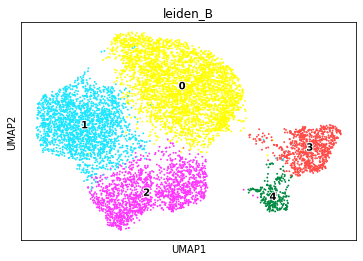

In [204]:
sc.tl.leiden(ascs, key_added = 'leiden_B', resolution = .3)
sc.pl.umap(ascs, color = ['leiden_B'], legend_loc = 'on data', legend_fontoutline = 2)

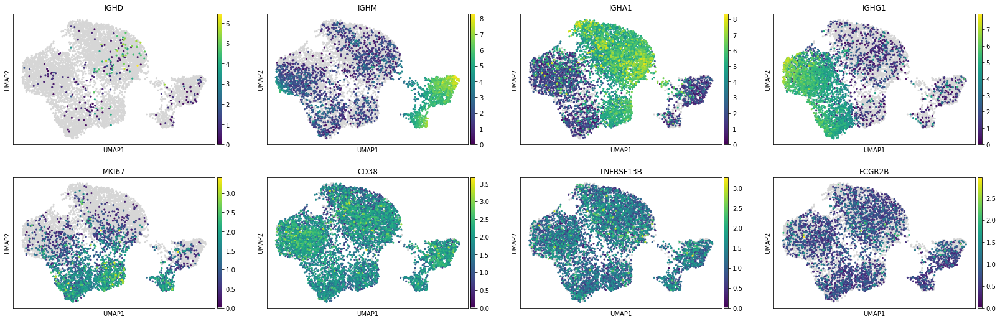

In [205]:
sc.pl.umap(ascs, color = ['IGHD', 'IGHM', 'IGHA1', 'IGHG1', 'MKI67', 'CD38', 'TNFRSF13B', 'FCGR2B'], color_map = tools.cmp(), size = 40)

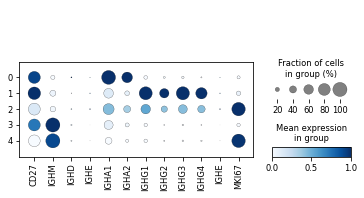

In [206]:
sc.pl.dotplot(ascs, ['CD27','IGHM','IGHD', 'IGHE', 'IGHA1', 'IGHA2', 'IGHG1','IGHG2','IGHG3','IGHG4','IGHE', 'MKI67'], groupby = 'leiden_B', color_map = 'Blues', standard_scale = 'var')

In [207]:
# read in the adt file
# adt = sc.read_h5ad('h5ad/df.fil3_adt.h5ad')
badt = adt[adt.obs_names.isin(ascs.obs_names)].copy()
badt.obsm = ascs.obsm.copy()
badt.obs = ascs.obs.copy()
# badt

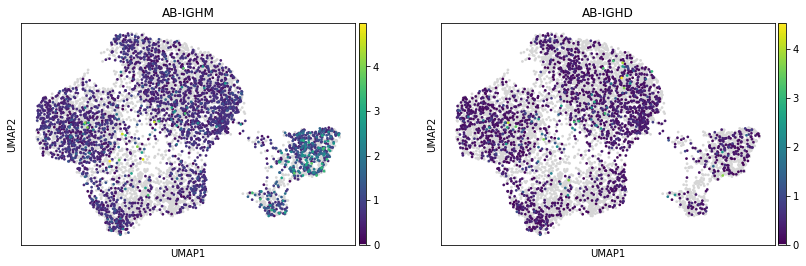

In [208]:
sc.pl.umap(badt, color = ['AB-IGHM', 'AB-IGHD'], color_map = tools.cmp(), size = 30)

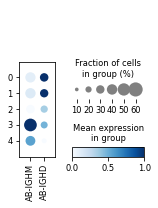

In [209]:
ax = sc.pl.dotplot(badt, ['AB-IGHM','AB-IGHD'], groupby = 'leiden_B', color_map = 'Blues', standard_scale = 'var', return_fig = True)
ax.style(dot_edge_lw = 0, cmap = 'Blues')
ax.show()

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'celltype_B' as categorical


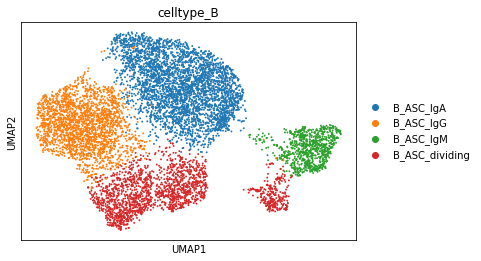

In [210]:
b_dict = {'0':'B_ASC_IgA',
'1':'B_ASC_IgG',
'2':'B_ASC_dividing',
'3':'B_ASC_IgM',
'4':'B_ASC_dividing',}
ascs.obs['celltype_B'] = [b_dict[x] for x in ascs.obs['leiden_B']]
sc.pl.umap(ascs, color = 'celltype_B')

### subcluster naive again

In [212]:
bnav = adata[adata.obs['celltype_B'] == 'B_naive'].copy()

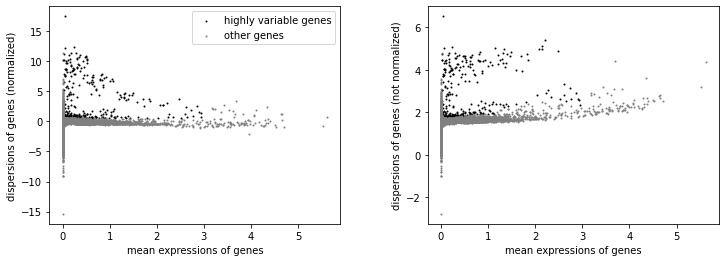

In [213]:
# find highly variable genes
sc.pp.highly_variable_genes(bnav, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(bnav)

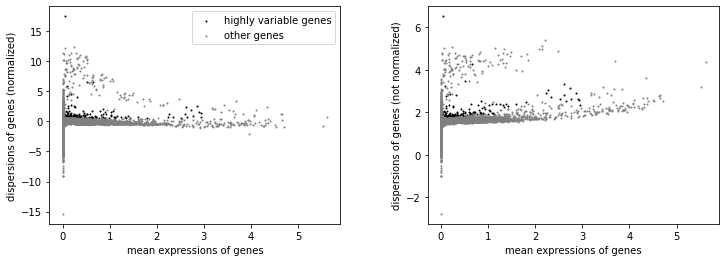

In [214]:
# remove vdj and light chain constant genes from highly variable genes, and also the viral reads
import re
for i in bnav.var.index:
    if re.search('^IG[HKL][VDJC]|VIRAL|^MTRNR', i):
        bnav.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(bnav)

In [215]:
# transfer to .raw slot
bnav.raw = bnav

In [216]:
# Filter the rna genes to only those marked as highly-variable
bnav = bnav[:, bnav.var.highly_variable].copy()
bnav

AnnData object with n_obs × n_vars = 43826 × 284
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'nCount_ADT_raw', 'nFeature_ADT_raw', 'nCount_RNA_raw', 'nFeature_RNA_raw', 'soupxOnAdt', 'soupxOnRna', 'percentMito', 'exclude', 'centre', 'pool', 'tcrId', 'bcrId', 'celltypist_broad_predLabel', 'celltypist_broad_maxPredProb', 'haniffa_broad_predLabel', 'haniffa_broad_maxPredProb', 'yoshida_broad_predLabel', 'yoshida_broad_maxPredProb', 'celltypist_detailed_predLabel', 'celltypist_detailed_maxPredProb', 'yoshida_detailed_predLabel', 'yoshida_detailed_maxPredProb', 'seurat_clusters', 'RNA_sequencing_saturation', 'pool_factor', 'RNA_readsConfidentlyOnTranscriptome', 'RNA_readsConfidentlyOnGenome', 'RNA_readsOnGenome', 'RNA_Q30readsBarcode', 'RNA_Q30readsRead', 'RNA_Q30readsUmi', 'rna_snn_res.4', 'rna_snn_res.0.5', 'rna_snn_res.0.1', 'harmony_snn_res.4', 'yoshida_broad_predLabel_majorVote', 'harmony_snn_res.0.5', 'harmony_snn_res.0.1', 'cell_type_compartment

In [217]:
scvi.model.SCVI.setup_anndata(
    bnav,
    layer="counts",
    batch_key = 'orig.ident',
    continuous_covariate_keys=['nCount_RNA', 'percentMito']
)
model = scvi.model.SCVI(bnav)
model.train()
latent = model.get_latent_representation()
bnav.obsm["X_scVI"] = latent

INFO     Using batches from adata.obs["orig.ident"]                                          
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Successfully registered anndata object containing 43826 cells, 284 vars, 118        
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 2 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/data/_anndata.py:728: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[alternate_column_key] = codes
/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/data/_anndata.py:586: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[labels_key] = np.zeros(adata.shape[0], dtype=np.int64)
/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/data/_anndata.py:315: UserWarning: Training will

Epoch 1/183:   0%|                                                                                                                    | 0/183 [00:00<?, ?it/s]

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 183/183: 100%|██████████████████████████████████████████████████████████████████████████████████████| 183/183 [10:01<00:00,  3.29s/it, loss=81, v_num=1]


/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scvi/model/base/_base_model.py:150: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  warnings.warn(


In [218]:
sc.pp.neighbors(bnav, use_rep="X_scVI")
sc.tl.umap(bnav, min_dist=0.3)

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/scanpy/tools/_leiden.py:158: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[key_added] = pd.Categorical(


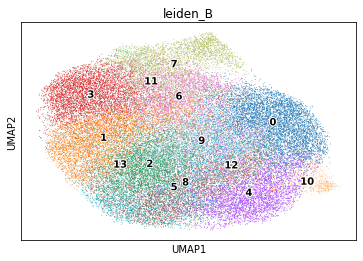

In [219]:
sc.tl.leiden(bnav, key_added = 'leiden_B')
sc.pl.umap(bnav, color = ['leiden_B'], legend_loc = 'on data', legend_fontoutline = 2)

In [ ]:
# sc.tl.leiden(bnav, key_added = 'leiden_B2', restrict_to = ('leiden_B', ['3']), resolution = .3)
# # sc.tl.leiden(bnav, key_added = 'leiden_B2', restrict_to = ('leiden_B2', ['10']), resolution = .5)
# sc.pl.umap(bnav, color = ['leiden_B2', 'celltype_B'], legend_loc = 'on data', legend_fontoutline = 2)

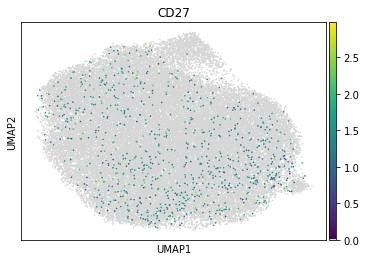

In [220]:
sc.pl.umap(bnav, color = ['CD27'], color_map = tools.cmp(), size = 10)

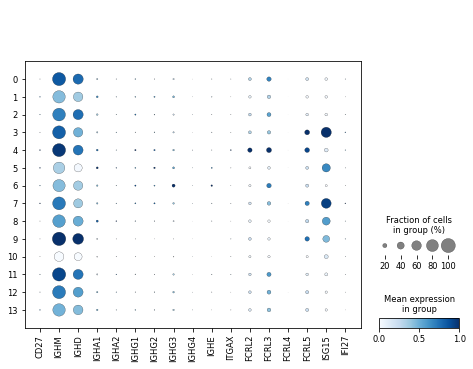

In [58]:
sc.pl.dotplot(bnav, ['CD27','IGHM','IGHD','IGHA1', 'IGHA2', 'IGHG1','IGHG2','IGHG3','IGHG4','IGHE','ITGAX', 'FCRL2','FCRL3','FCRL4','FCRL5', 'ISG15', 'IFI27'], groupby = 'leiden_B', color_map = 'Blues', standard_scale = 'var')

/tmp/ipykernel_46125/826093910.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  bnav.obs[i] = pd.Series(bdata.obs[i])


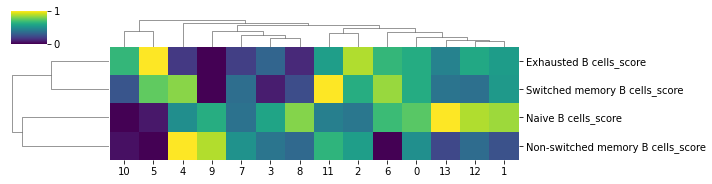

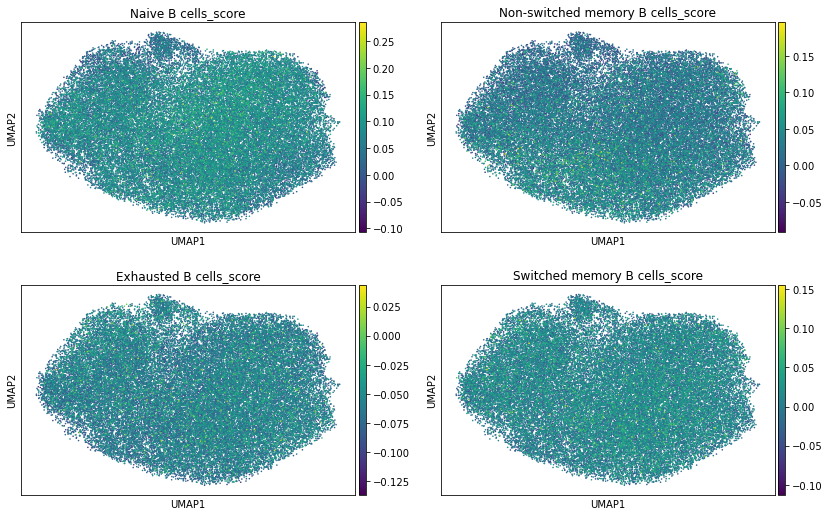

In [60]:
for i in ['Naive B cells_score', 'Non-switched memory B cells_score', 'Exhausted B cells_score', 'Switched memory B cells_score']:
    bnav.obs[i] = pd.Series(bdata.obs[i])
summarised_geneset_scores(bnav, ['Naive B cells_score', 
                                  'Non-switched memory B cells_score', 
                                  'Exhausted B cells_score', 
                                  'Switched memory B cells_score'], 
                          'leiden_B',
                          (10,2.5))

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'celltype_B' as categorical


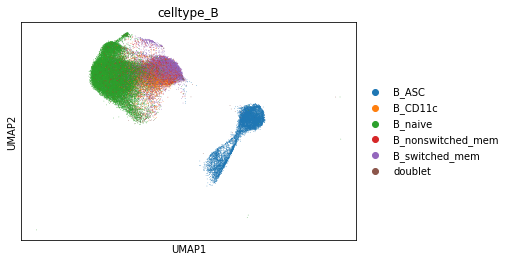

In [61]:
sc.pl.umap(adata, color = 'celltype_B')

### Update the main B cell object

/nfs/team297/kt16/Softwares/conda/envs/scvi-env/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'celltype_B' as categorical


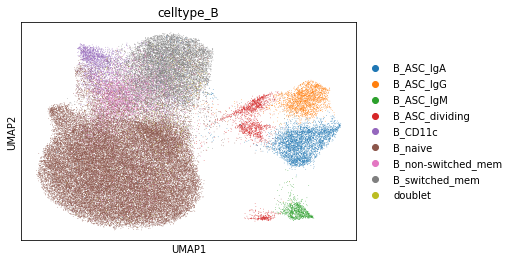

In [221]:
bdata.obs['celltype_B'] = bdata.obs['celltype_B'].astype('object')
bdata.obs['celltype_B'].update(pd.Series(ascs.obs['celltype_B']))
bdata.obs['celltype_B'].update(pd.Series(bcell.obs['celltype_B']))
sc.pl.umap(bdata, color = 'celltype_B')

In [223]:
## save for now
bdata.write('h5ad/df.fil3_gex_bcells_no_CLL_230622.h5ad', compression = 'gzip')

In [ ]:
### kernel died...

In [1]:
import os
import tools
import numpy as np
import pandas as pd
import scanpy as sc

sc.logging.print_header()

scanpy==1.8.1 anndata==0.7.6 umap==0.5.1 numpy==1.22.4 scipy==1.6.2 pandas==1.2.4 scikit-learn==0.24.2 statsmodels==0.12.2 python-igraph==0.9.1 pynndescent==0.5.2


In [2]:
os.chdir('/lustre/scratch117/cellgen/team297/kt16/COVID_imperial_renal')

In [3]:
adata = sc.read_h5ad('h5ad/df.fil3_gex_kt_230622.h5ad')
adata

AnnData object with n_obs × n_vars = 916806 × 33559
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'nCount_ADT_raw', 'nFeature_ADT_raw', 'nCount_RNA_raw', 'nFeature_RNA_raw', 'soupxOnAdt', 'soupxOnRna', 'percentMito', 'exclude', 'centre', 'pool', 'tcrId', 'bcrId', 'celltypist_broad_predLabel', 'celltypist_broad_maxPredProb', 'haniffa_broad_predLabel', 'haniffa_broad_maxPredProb', 'yoshida_broad_predLabel', 'yoshida_broad_maxPredProb', 'celltypist_detailed_predLabel', 'celltypist_detailed_maxPredProb', 'yoshida_detailed_predLabel', 'yoshida_detailed_maxPredProb', 'seurat_clusters', 'RNA_sequencing_saturation', 'pool_factor', 'RNA_readsConfidentlyOnTranscriptome', 'RNA_readsConfidentlyOnGenome', 'RNA_readsOnGenome', 'RNA_Q30readsBarcode', 'RNA_Q30readsRead', 'RNA_Q30readsUmi', 'rna_snn_res.4', 'rna_snn_res.0.5', 'rna_snn_res.0.1', 'harmony_snn_res.4', 'yoshida_broad_predLabel_majorVote', 'harmony_snn_res.0.5', 'harmony_snn_res.0.1', 'cell_type_compartm

In [4]:
bdata = sc.read_h5ad('h5ad/df.fil3_gex_bcells_no_CLL_230622.h5ad')
bdata

AnnData object with n_obs × n_vars = 68683 × 330
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'nCount_ADT_raw', 'nFeature_ADT_raw', 'nCount_RNA_raw', 'nFeature_RNA_raw', 'soupxOnAdt', 'soupxOnRna', 'percentMito', 'exclude', 'centre', 'pool', 'tcrId', 'bcrId', 'celltypist_broad_predLabel', 'celltypist_broad_maxPredProb', 'haniffa_broad_predLabel', 'haniffa_broad_maxPredProb', 'yoshida_broad_predLabel', 'yoshida_broad_maxPredProb', 'celltypist_detailed_predLabel', 'celltypist_detailed_maxPredProb', 'yoshida_detailed_predLabel', 'yoshida_detailed_maxPredProb', 'seurat_clusters', 'RNA_sequencing_saturation', 'pool_factor', 'RNA_readsConfidentlyOnTranscriptome', 'RNA_readsConfidentlyOnGenome', 'RNA_readsOnGenome', 'RNA_Q30readsBarcode', 'RNA_Q30readsRead', 'RNA_Q30readsUmi', 'rna_snn_res.4', 'rna_snn_res.0.5', 'rna_snn_res.0.1', 'harmony_snn_res.4', 'yoshida_broad_predLabel_majorVote', 'harmony_snn_res.0.5', 'harmony_snn_res.0.1', 'cell_type_compartment

### Incorporate VDJ data

In [5]:
# read in the BCR files
sampleinfo = pd.read_csv('processed/BCR/bcr_meta.csv')
sampleinfo

,sample,individual
0,C101,C101_tigger
1,C103,C103_tigger
2,C104,C104_tigger
3,C106,C106_tigger
4,C108,C108_tigger
...,...,...
58,C69,C69_tigger
59,C73,C73_tigger
60,C82,C82_tigger
61,C85,C85_tigger


In [6]:
samples = sampleinfo['sample']
bcr_files = []
for sample in samples:
    filelocation = 'processed/BCR/'+ sample +'/dandelion/all_contig_dandelion.tsv'
    bcr_files.append(pd.read_csv(filelocation, sep = '\t'))

/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (91) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [7]:
# concatenate and check if the table is constructed properly
bcr = bcr_files[0].append(bcr_files[1:])
bcr.reset_index(inplace = True, drop = True)
bcr.shape

(363144, 116)

In [8]:
# to speed this up slightly, I will also remove the barcodes that not found in the transcriptome data
bcr = bcr[bcr['cell_id'].isin(list(set(bdata.obs_names)))]
bcr.shape

(130326, 116)

In [9]:
import dandelion as ddl
ddl.logging.print_header()

dandelion==0.2.2.dev107 pandas==1.2.4 numpy==1.22.4 matplotlib==3.3.4 networkx==2.5.1 scipy==1.6.2


In [10]:
vdj, bdata2 = ddl.pp.filter_contigs(bcr, bdata)

Preparing data: 119291it [00:46, 2572.44it/s]
Scanning for poor quality/ambiguous contigs: 100%|██████████| 59444/59444 [08:27<00:00, 117.21it/s]


Finishing up filtering
Initializing Dandelion object


In [11]:
vdj

Dandelion class object with n_obs = 44549 and n_contigs = 88971
    data: 'sequence_id', 'sequence', 'rev_comp', 'productive', 'v_call', 'd_call', 'j_call', 'sequence_alignment', 'germline_alignment', 'junction', 'junction_aa', 'v_cigar', 'd_cigar', 'j_cigar', 'stop_codon', 'vj_in_frame', 'locus', 'junction_length', 'np1_length', 'np2_length', 'v_sequence_start', 'v_sequence_end', 'v_germline_start', 'v_germline_end', 'd_sequence_start', 'd_sequence_end', 'd_germline_start', 'd_germline_end', 'j_sequence_start', 'j_sequence_end', 'j_germline_start', 'j_germline_end', 'v_score', 'v_identity', 'v_support', 'd_score', 'd_identity', 'd_support', 'j_score', 'j_identity', 'j_support', 'fwr1', 'fwr2', 'fwr3', 'fwr4', 'cdr1', 'cdr2', 'cdr3', 'cell_id', 'c_call', 'consensus_count', 'duplicate_count', 'v_call_10x', 'd_call_10x', 'j_call_10x', 'junction_10x', 'junction_10x_aa', 'j_support_igblastn', 'j_score_igblastn', 'j_call_igblastn', 'j_call_blastn', 'j_identity_blastn', 'j_alignment_length_b

In [12]:
bdata2

AnnData object with n_obs × n_vars = 68683 × 330
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'nCount_ADT_raw', 'nFeature_ADT_raw', 'nCount_RNA_raw', 'nFeature_RNA_raw', 'soupxOnAdt', 'soupxOnRna', 'percentMito', 'exclude', 'centre', 'pool', 'tcrId', 'bcrId', 'celltypist_broad_predLabel', 'celltypist_broad_maxPredProb', 'haniffa_broad_predLabel', 'haniffa_broad_maxPredProb', 'yoshida_broad_predLabel', 'yoshida_broad_maxPredProb', 'celltypist_detailed_predLabel', 'celltypist_detailed_maxPredProb', 'yoshida_detailed_predLabel', 'yoshida_detailed_maxPredProb', 'seurat_clusters', 'RNA_sequencing_saturation', 'pool_factor', 'RNA_readsConfidentlyOnTranscriptome', 'RNA_readsConfidentlyOnGenome', 'RNA_readsOnGenome', 'RNA_Q30readsBarcode', 'RNA_Q30readsRead', 'RNA_Q30readsUmi', 'rna_snn_res.4', 'rna_snn_res.0.5', 'rna_snn_res.0.1', 'harmony_snn_res.4', 'yoshida_broad_predLabel_majorVote', 'harmony_snn_res.0.5', 'harmony_snn_res.0.1', 'cell_type_compartment

... storing 'filter_rna' as categorical
... storing 'has_contig' as categorical
... storing 'filter_contig_quality' as categorical
... storing 'filter_contig_VDJ' as categorical
... storing 'filter_contig_VJ' as categorical
... storing 'contig_QC_pass' as categorical


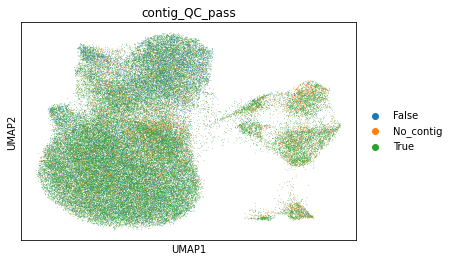

In [13]:
sc.pl.umap(bdata2, color = 'contig_QC_pass')

In [14]:
pd.crosstab(bdata2.obs['filter_contig'], bdata2.obs['contig_QC_pass'])

contig_QC_pass,False,No_contig,True
filter_contig,,,
False,7581,9239,44549
True,7314,0,0


In [15]:
ddl.tl.find_clones(vdj)

Finding clones based on VDJ chains : 100%|██████████| 454/454 [00:06<00:00, 68.03it/s] 
Refining clone assignment based on VJ chain pairing : 100%|██████████| 44549/44549 [00:00<00:00, 464505.67it/s]


In [16]:
if not os.path.exists('h5ddl'):
    os.makedirs('h5ddl')
vdj.write_h5('h5ddl/df.fil3_gex_bcells_no_CLL_vdj_230622.h5ddl', compression = 'blosc:lz4')

<ipython-input-16-8d06518070e6>:3: DeprecationWarning: write_h5 is a deprecated in 0.2.2 and will be removed in 0.4.0. write_h5ddl will be the recommended way to save.


In [17]:
ddl.tl.transfer(bdata2, vdj)

In [18]:
bdata2.write_h5ad('h5ad/df.fil3_gex_bcells_no_CLL_vdj_230622.h5ad', compression = 'gzip')

... storing 'clone_id' as categorical
... storing 'locus_VDJ' as categorical
... storing 'locus_VJ' as categorical
... storing 'productive_VDJ' as categorical
... storing 'productive_VJ' as categorical
... storing 'v_call_genotyped_VDJ' as categorical
... storing 'v_call_genotyped_VJ' as categorical
... storing 'd_call_VDJ' as categorical
... storing 'j_call_VDJ' as categorical
... storing 'j_call_VJ' as categorical
... storing 'c_call_VDJ' as categorical
... storing 'c_call_VJ' as categorical
... storing 'duplicate_count_VDJ' as categorical
... storing 'duplicate_count_VJ' as categorical
... storing 'junction_VDJ' as categorical
... storing 'junction_VJ' as categorical
... storing 'junction_aa_VDJ' as categorical
... storing 'junction_aa_VJ' as categorical
... storing 'isotype' as categorical
... storing 'isotype_status' as categorical
... storing 'locus_status' as categorical
... storing 'productive_status' as categorical
... storing 'rearrangement_VDJ_status' as categorical
... stor

In [ ]:
## kernel died...

In [19]:
# import os
# import tools
# import numpy as np
# import pandas as pd
# import scanpy as sc

# sc.logging.print_header()

In [20]:
# os.chdir('/lustre/scratch117/cellgen/team297/kt16/COVID_imperial_renal')

In [21]:
# adata = sc.read_h5ad('h5ad/df.fil3_gex_kt_230622.h5ad')
# adata

In [22]:
# bdata2 = sc.read_h5ad('h5ad/df.fil3_gex_bcells_no_CLL_vdj_230622.h5ad')
# bdata2

In [24]:
# manually exlcude IgD+ cells in the putative ASC cluster
pd.crosstab(bdata2.obs['gmm_pct_b_scores'], bdata2.obs['isotype_status'])

isotype_status,IgA,IgD,IgD|IgM,IgE,IgG,IgM,Multi,No_contig,None
gmm_pct_b_scores,,,,,,,,,
0,3164,43,0,1,1862,707,2,2536,4
1,3405,2988,240,1,2973,28592,46,21598,521


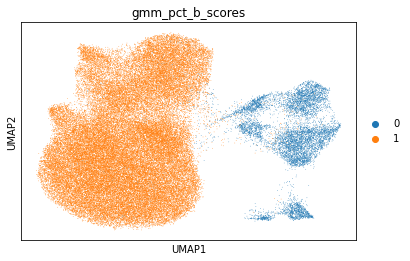

In [25]:
sc.pl.umap(bdata2, color = 'gmm_pct_b_scores')

In [26]:
pd.crosstab(bdata2.obs['celltype_B'], bdata2.obs['isotype_status'])

isotype_status,IgA,IgD,IgD|IgM,IgE,IgG,IgM,Multi,No_contig,None
celltype_B,,,,,,,,,
B_ASC_IgA,2463,37,0,1,36,6,1,922,2
B_ASC_IgG,106,0,0,0,1255,2,0,781,0
B_ASC_IgM,44,0,0,0,8,497,0,305,0
B_ASC_dividing,551,6,0,0,563,202,1,528,2
B_CD11c,323,51,3,0,359,383,1,1118,44
B_naive,115,2823,231,0,218,25907,37,14310,185
B_non-switched_mem,430,53,5,0,216,1515,0,1168,36
B_switched_mem,2485,57,1,1,2140,741,8,4713,253
doublet,52,4,0,0,40,46,0,289,3


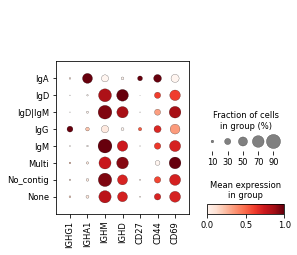

In [27]:
sc.pl.dotplot(bdata2[bdata2.obs['celltype_B'] == 'B_naive'], ['IGHG1', 'IGHA1', 'IGHM', 'IGHD', 'CD27', 'CD44', 'CD69'], 
              groupby = 'isotype_status', 
              standard_scale = 'var')

In [28]:
bdata2.obs['celltype_B_corrected'] = bdata2.obs['celltype_B'].astype('object')

In [29]:
for i in bdata2.obs.index:
    iso = bdata2.obs.loc[i, 'isotype_status']
    if bdata2.obs.loc[i, 'celltype_B_corrected'] == 'B_ASC_IgA':
        if iso in ['IgA', 'Multi', 'No_contig', 'None']:
            continue
        if iso in ['IgE', 'IgD']:
            bdata2.obs.at[i, 'celltype_B_corrected'] = 'B_ASC_other'
        if iso == 'IgM':
            bdata2.obs.at[i, 'celltype_B_corrected'] = 'B_ASC_IgM'
        if iso == 'IgG':
            bdata2.obs.at[i, 'celltype_B_corrected'] = 'B_ASC_IgG'
    if bdata2.obs.loc[i, 'celltype_B_corrected'] == 'B_ASC_IgG':
        if iso in ['IgG', 'Multi', 'No_contig', 'None']:
            continue
        if iso in ['IgE', 'IgD']:
            bdata2.obs.at[i, 'celltype_B_corrected'] = 'B_ASC_other'
        if iso == 'IgM':
            bdata2.obs.at[i, 'celltype_B_corrected'] = 'B_ASC_IgM'
        if iso == 'IgA':
            bdata2.obs.at[i, 'celltype_B_corrected'] = 'B_ASC_IgA'
    if bdata2.obs.loc[i, 'celltype_B_corrected'] == 'B_ASC_IgM':
        if iso in ['IgM', 'Multi', 'No_contig', 'None']:
            continue
        if iso in ['IgE', 'IgD']:
            bdata2.obs.at[i, 'celltype_B_corrected'] = 'B_ASC_other'
        if iso == 'IgG':
            bdata2.obs.at[i, 'celltype_B_corrected'] = 'B_ASC_IgG'
        if iso == 'IgA':
            bdata2.obs.at[i, 'celltype_B_corrected'] = 'B_ASC_IgA'
    if bdata2.obs.loc[i, 'celltype_B_corrected'] == 'B_non-switched_mem':
        if iso in ['IgM', 'IgD', 'IgM|IgD', 'IgD|IgM', 'Multi', 'No_contig', 'None']:
            pass
        else:
            bdata2.obs.at[i, 'celltype_B_corrected'] = 'B_switched_mem'
    if bdata2.obs.loc[i, 'celltype_B_corrected'] == 'B_switched_mem':
        if iso in ['IgG', 'IgA', 'IgE', 'Multi', 'No_contig', 'None']:
            pass
        else:
            bdata2.obs.at[i, 'celltype_B_corrected'] = 'B_non-switched_mem'
    if bdata2.obs.loc[i, 'celltype_B_corrected'] == 'B_naive':
        if iso in ['IgM', 'IgD', 'IgM|IgD', 'IgD|IgM', 'Multi', 'No_contig', 'None']:
            pass
        else:
            bdata2.obs.at[i, 'celltype_B_corrected'] = 'B_switched_mem'

In [30]:
pd.crosstab(bdata2.obs['celltype_B_corrected'], bdata2.obs['isotype_status'])

isotype_status,IgA,IgD,IgD|IgM,IgE,IgG,IgM,Multi,No_contig,None
celltype_B_corrected,,,,,,,,,
B_ASC_IgA,2613,0,0,0,0,0,1,922,2
B_ASC_IgG,0,0,0,0,1299,0,0,781,0
B_ASC_IgM,0,0,0,0,0,505,0,305,0
B_ASC_dividing,551,6,0,0,563,202,1,528,2
B_ASC_other,0,37,0,1,0,0,0,0,0
B_CD11c,323,51,3,0,359,383,1,1118,44
B_naive,0,2823,231,0,0,25907,37,14310,185
B_non-switched_mem,0,110,6,0,0,2256,0,1168,36
B_switched_mem,3030,0,0,1,2574,0,8,4713,253


... storing 'celltype_B_corrected' as categorical


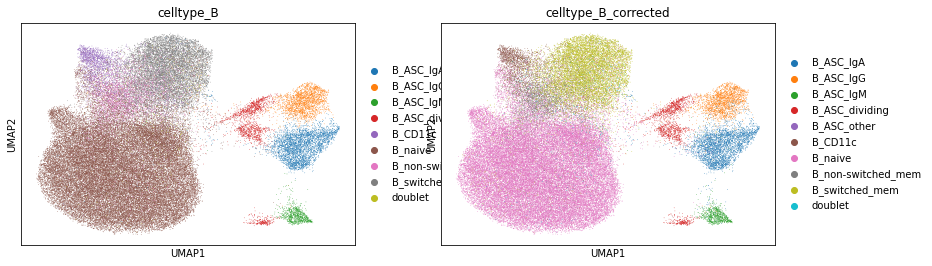

In [31]:
sc.pl.umap(bdata2, color = ['celltype_B', 'celltype_B_corrected'])

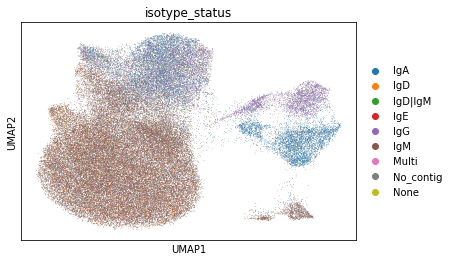

In [33]:
sc.pl.umap(bdata2, color = ['isotype_status'])

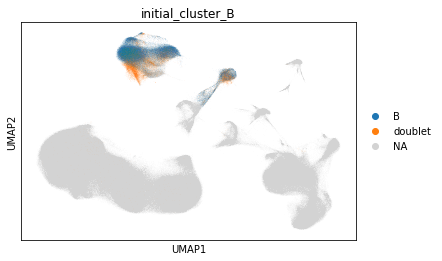

In [36]:
# update the raw object as well
# adata_raw2 = sc.read_h5ad('h5ad/df.fil3_gex_kt_230622.h5ad')
sc.pl.umap(adata, color = ['initial_cluster_B'])

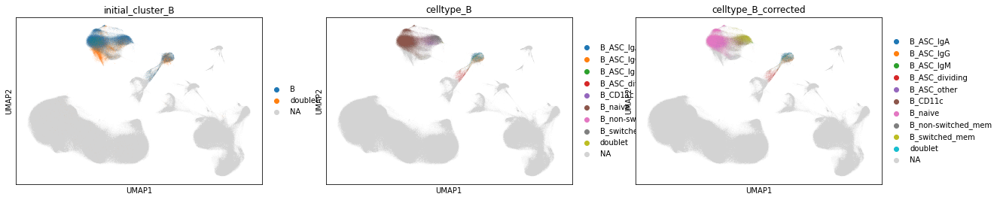

In [37]:
adata.obs['celltype_B'] = pd.Series(bdata2.obs['celltype_B'])
adata.obs['celltype_B_corrected'] = pd.Series(bdata2.obs['celltype_B_corrected'])
sc.pl.umap(adata, color = ['initial_cluster_B', 'celltype_B', 'celltype_B_corrected'])

In [38]:
# save first
bdata2.write_h5ad('h5ad/df.fil3_gex_bcells_no_CLL_vdj_230622.h5ad', compression = 'gzip')

In [39]:
adata.write_h5ad('h5ad/df.fil3_gex_kt_230622.h5ad', compression = 'gzip')